In [1]:
from typing import Generator, List
import os
import pandas as pd
import numpy as np
from ucsc_genomes_downloader import Genome
from keras_bed_sequence import BedSequence
from glob import glob
from tsnecuda import TSNE
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
from cache_decorator import Cache
from tqdm.auto import tqdm
from epigenomic_dataset import load_all_tasks
from epigenomic_dataset.utils import get_cell_lines, normalize_epigenomic_data
from sanitize_ml_labels import sanitize_ml_labels

/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/dtypes.py:516: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint8 = np.dtype([("qint8", np.int8, 1)])
/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/dtypes.py:517: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_quint8 = np.dtype([("quint8", np.uint8, 1)])
/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/dtypes.py:518: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint16 = np.dtype([("qint16", np.int16, 1)])
/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/dtypes.py:519: FutureWarning: Passing (type, 1) or 

In [2]:
genome = Genome("hg38")
nucleotides = "actg"
window_size = 256

Loading chromosomes for genome hg38:   0%|          | 0/25 [00:00<?, ?it/s]

In [3]:
colors = np.array([
    "#7fc97f", # active_enhancers
    "#beaed4", # inactive_enhancers
    "#fdc086", # active_promoters
    "#ffff99", # inactive_promoters
    "#386cb0", # other
    "#f0027f", # active_enhancers_and_promoters
    "#bf5b17", # inactive_enhancers_and_promoters
])

In [4]:
def get_bed(df: pd.DataFrame) -> pd.DataFrame:
    bed = pd.DataFrame(
        np.array([
            list(val)
            for val in df.index.values
        ]),
        columns=df.index.names
    )
    bed["chromStart"] = bed["chromStart"].astype(int)
    bed["chromEnd"] = bed["chromEnd"].astype(int)
    return bed

In [5]:
def get_task_color_map(task:str):
    maps = {
        "active_enhancers_vs_inactive_enhancers": [0, 1],
        "active_promoters_vs_inactive_promoters": [2, 3],
        "active_enhancers_vs_active_promoters": [2, 0],
        "inactive_enhancers_vs_inactive_promoters": [3, 1],
        "active_vs_inactive": [5, 6]
    }
    return np.array(maps[task])

In [6]:
def visualize_scatter_plot(
    embedding: np.ndarray,
    labels: np.ndarray,
    task: str,
    assembly: str,
    cell_line: str,
    window_size: str,
    data_type: str,
    colors: np.ndarray
):
    fig, axis = plt.subplots(figsize=(6, 6), dpi=100)
    true_class, false_class = sanitize_ml_labels(task.split("_vs_"))
    scatter = axis.scatter(
        *embedding.T,
        c=labels,
        cmap=ListedColormap(colors[get_task_color_map(task)]),
        s=5,
        marker=".",
        alpha=1,
    )
    axis.legend(
        handles=scatter.legend_elements()[0],
        labels=[false_class, true_class],
        loc='upper left'
    )
    axis.axis('off')
    plt.show()
    path = f"visualizations/{assembly}/{data_type}/{cell_line}/{window_size}/{task}.jpg"
    os.makedirs(os.path.dirname(path), exist_ok=True)
    fig.savefig(path)

In [7]:
@Cache(
    "embeddings/{assembly}/sequence/{cell_line}/{window_size}/{task}.csv.xz",
    args_to_ignore=["bed", "genome"]
)
def compute_sequence_embeddings(
    assembly: str,
    cell_line: str,
    window_size: int,
    bed: pd.DataFrame,
    genome: Genome,
    task: str
):
    sequence = np.array(BedSequence(
        genome,
        bed,
        batch_size=1,
        nucleotides=nucleotides,
        shuffle=False
    )).reshape(-1, window_size*len(nucleotides))
    tsne = TSNE(verbose=True)
    return pd.DataFrame(tsne.fit_transform(sequence))

@Cache(
    "embeddings/{assembly}/tabular/{cell_line}/{window_size}/{task}.csv.xz",
    args_to_ignore=["data"]
)
def compute_tabular_embeddings(
    assembly: str,
    cell_line: str,
    window_size: int,
    data: pd.DataFrame,
    task: str
):
    tsne = TSNE(verbose=True)
    return pd.DataFrame(tsne.fit_transform(data))

Cell line:   0%|          | 0/7 [00:00<?, ?it/s]

Executing CRR prediction tasks:   0%|          | 0/5 [00:00<?, ?it/s]

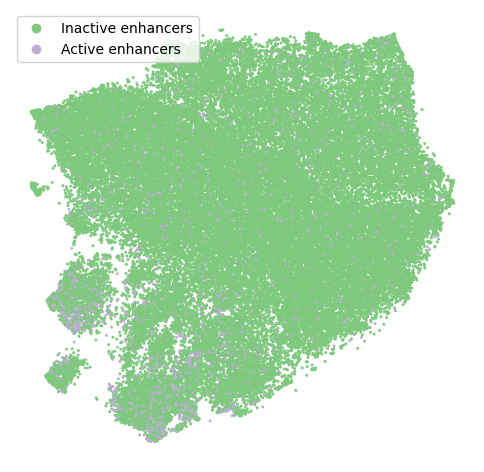

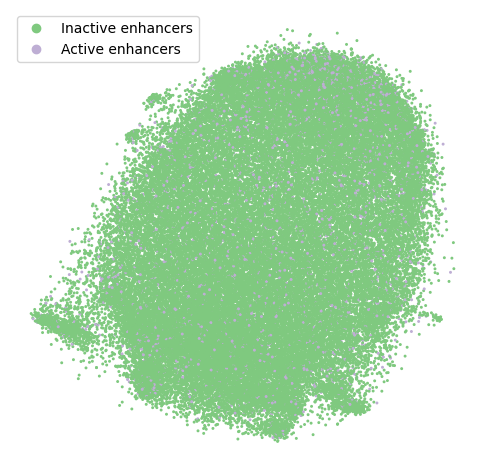

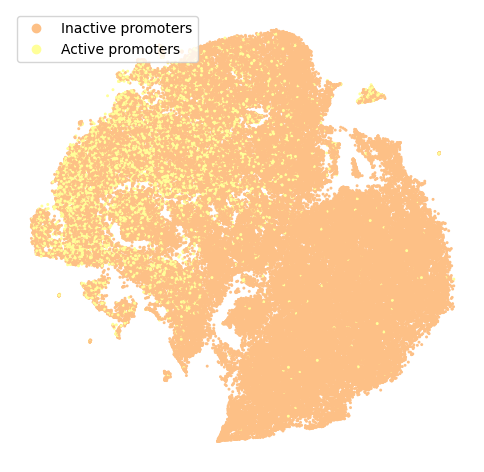

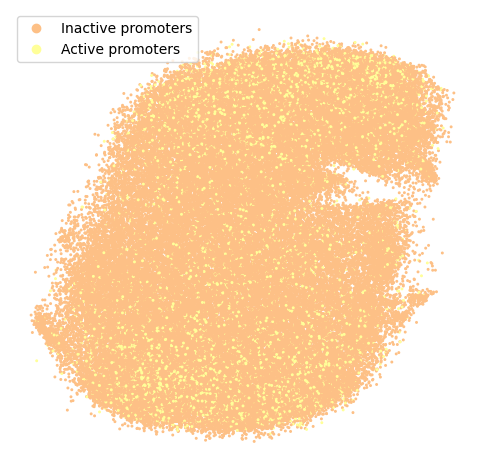

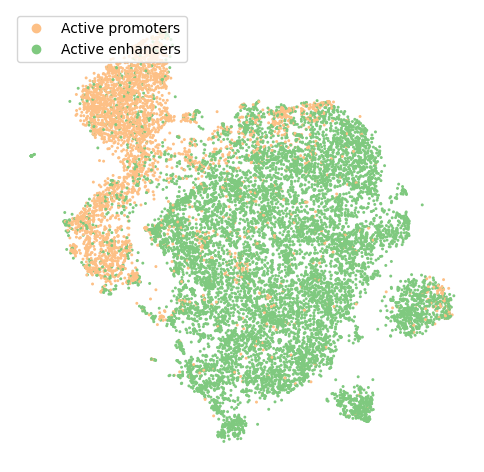

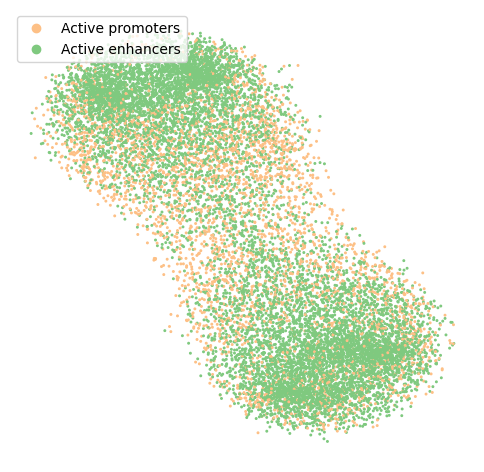

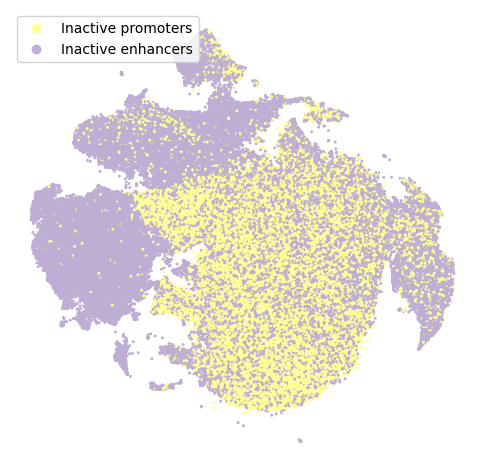

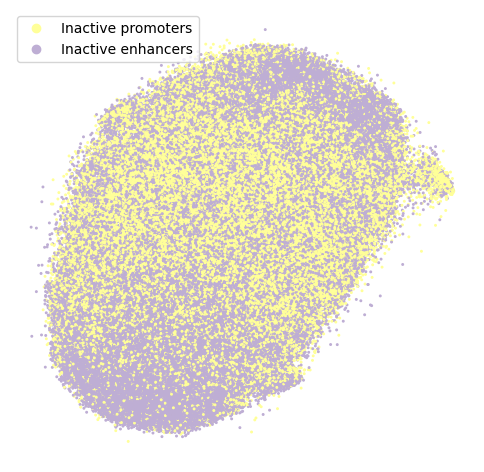

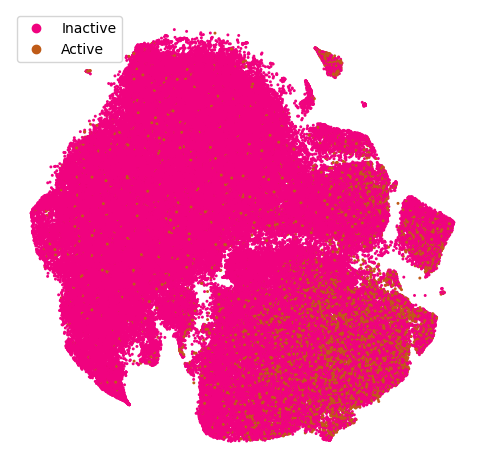

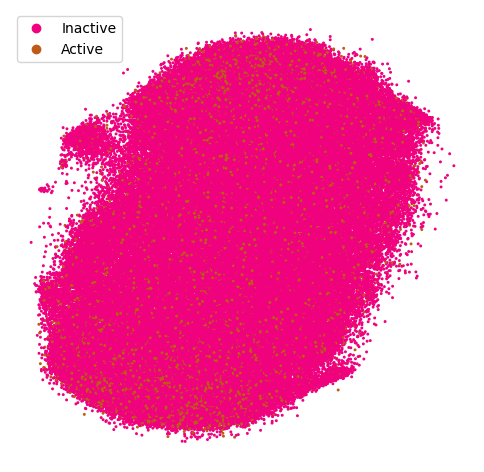

Executing CRR prediction tasks:   0%|          | 0/5 [00:00<?, ?it/s]

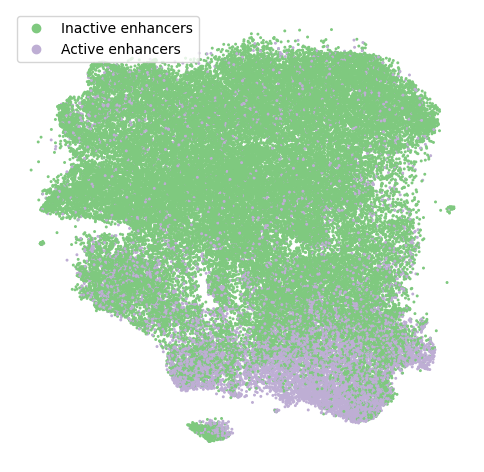

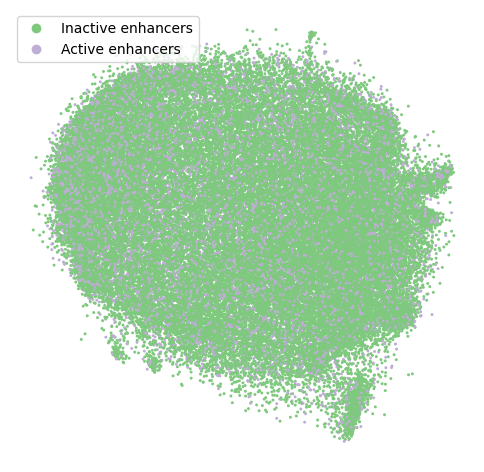

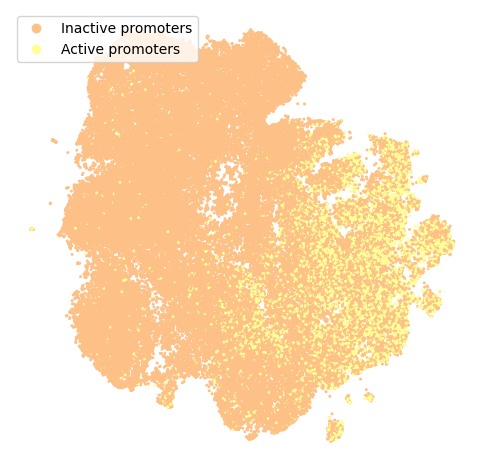

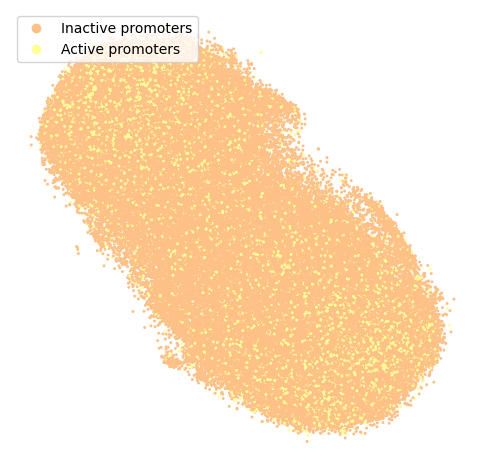

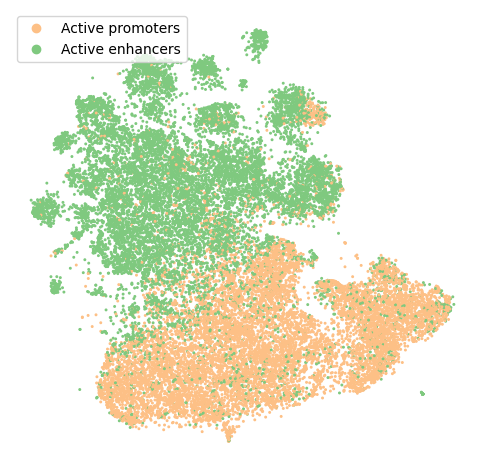

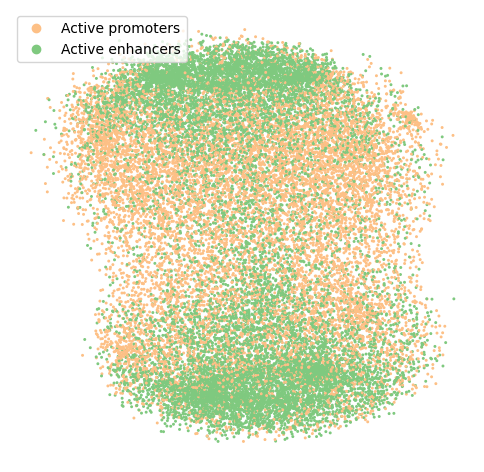

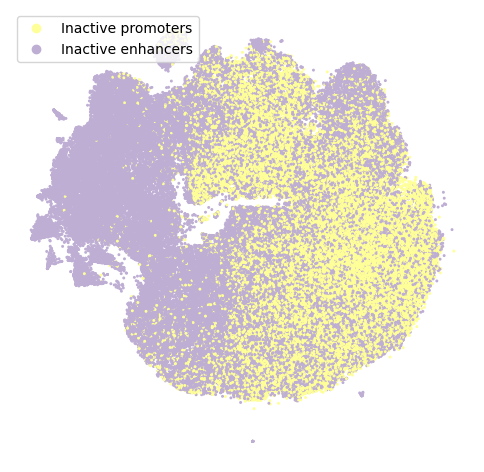

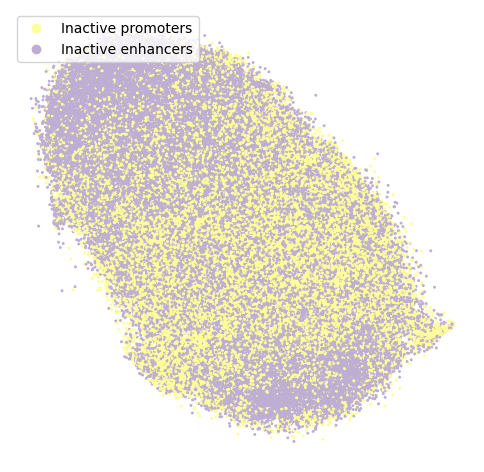

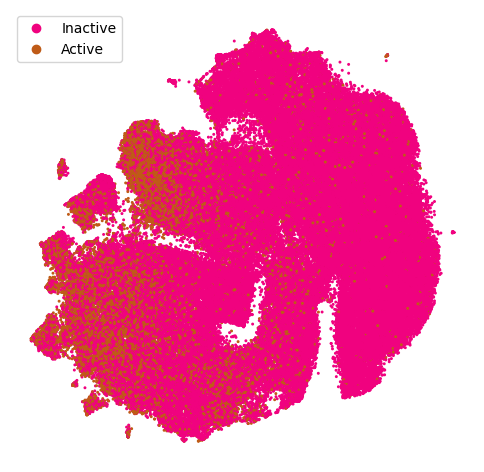

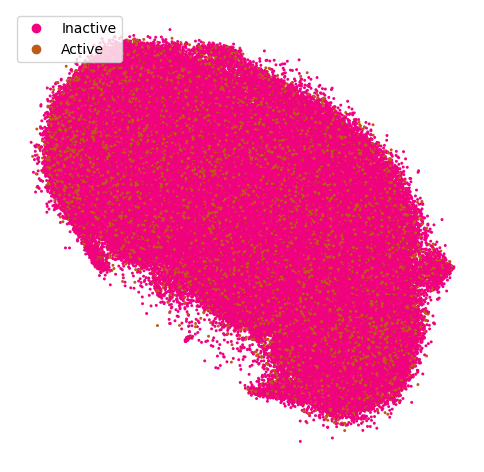

Executing CRR prediction tasks:   0%|          | 0/5 [00:00<?, ?it/s]

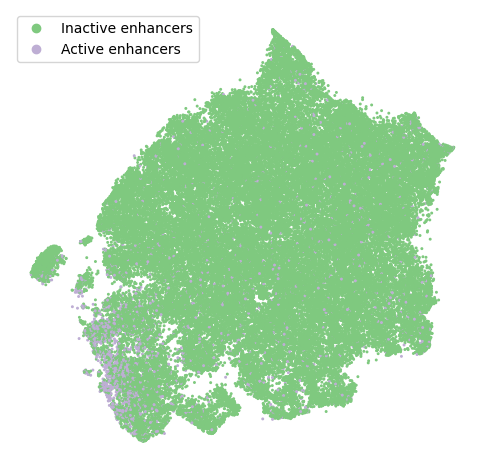

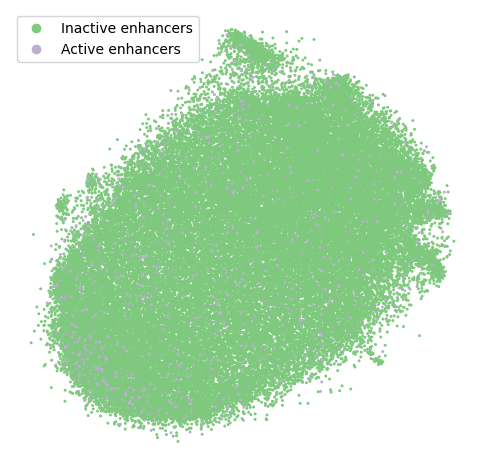

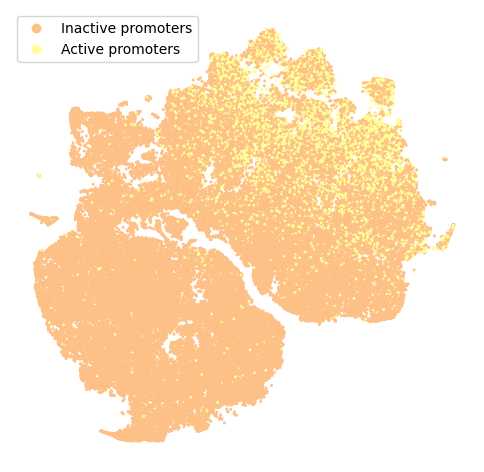

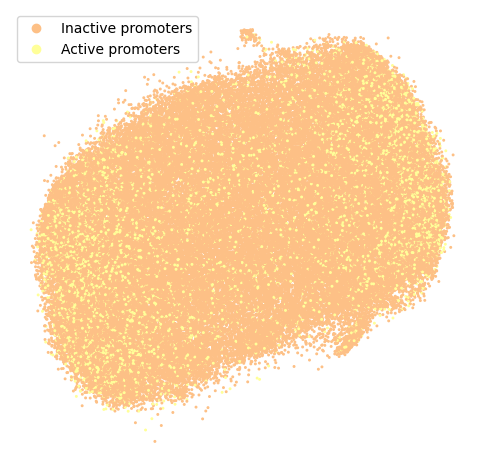

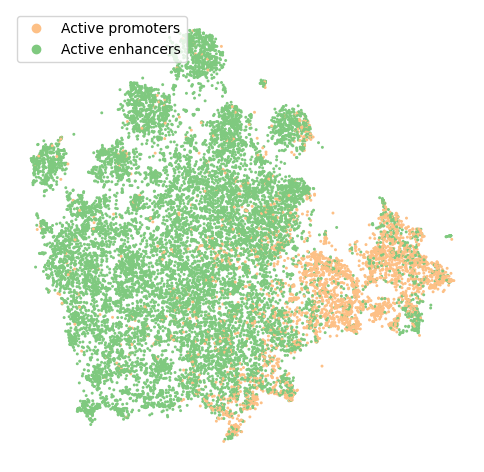

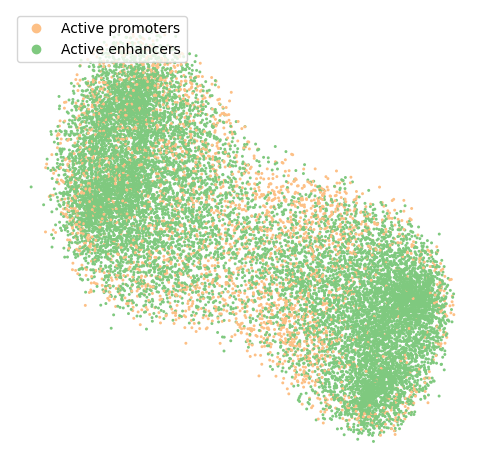

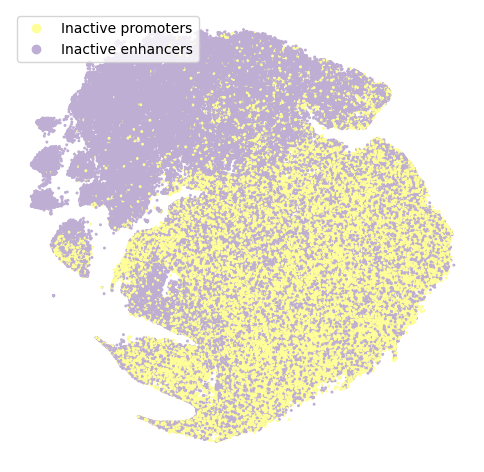

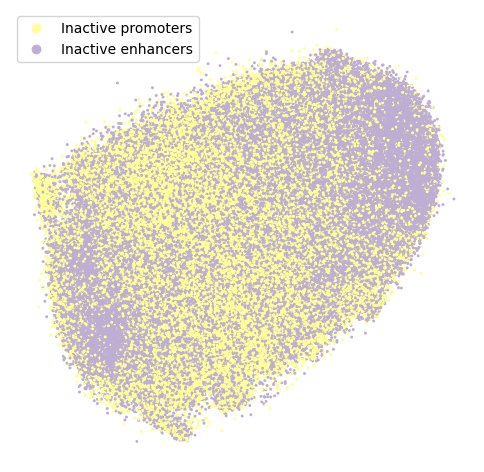

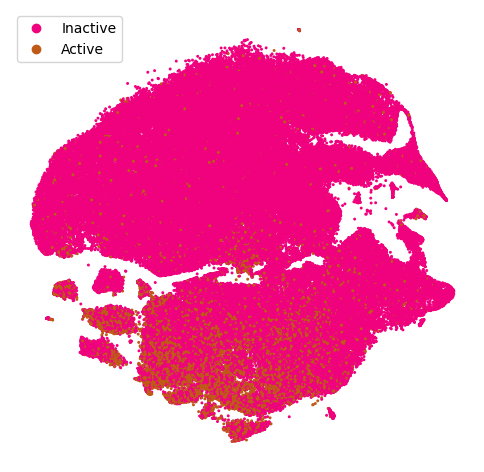

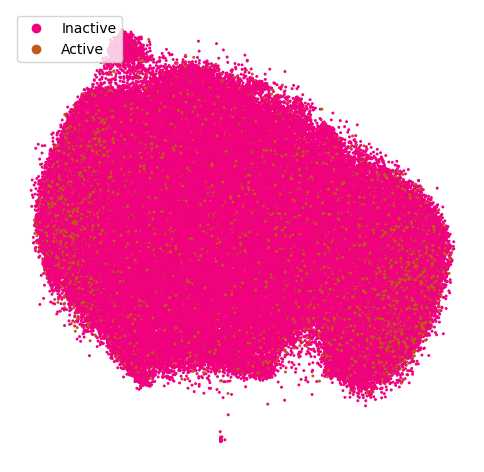

Executing CRR prediction tasks:   0%|          | 0/5 [00:00<?, ?it/s]

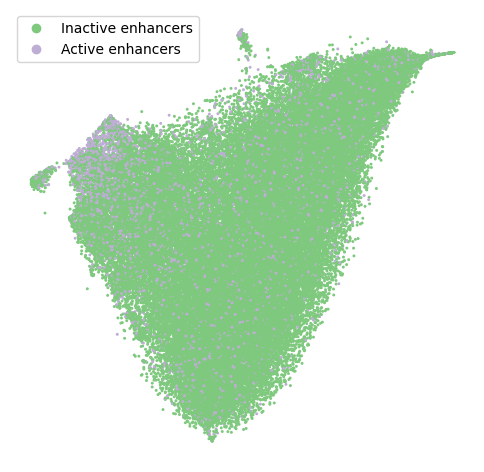

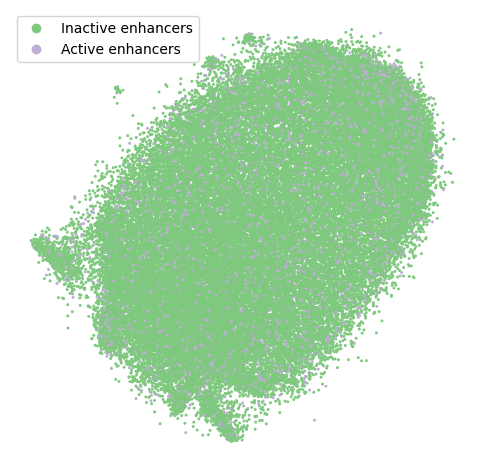

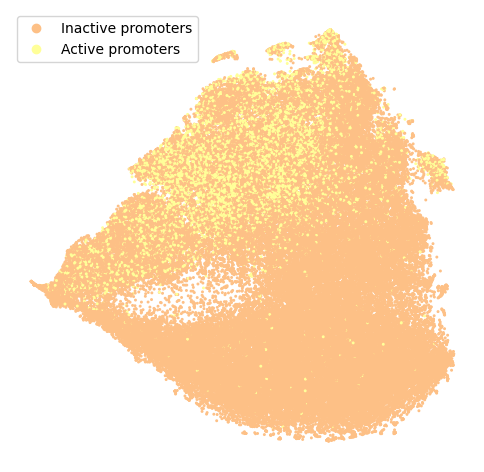

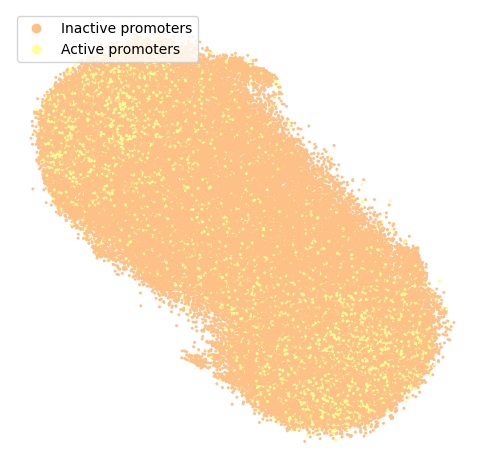

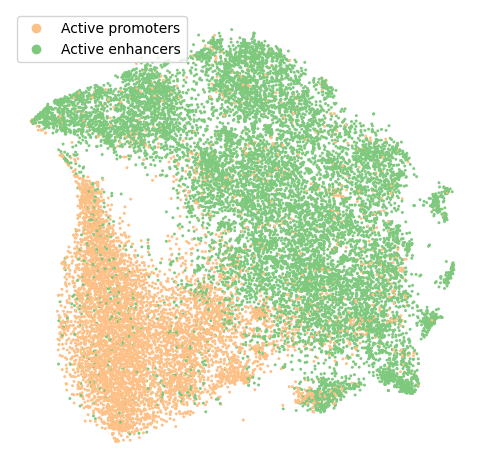

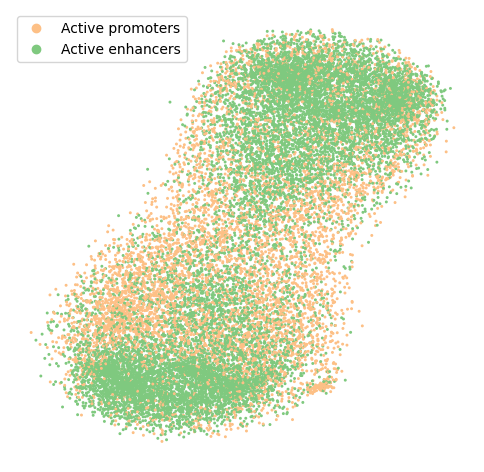

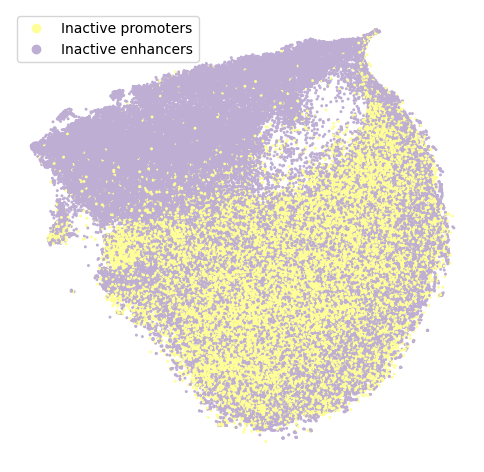

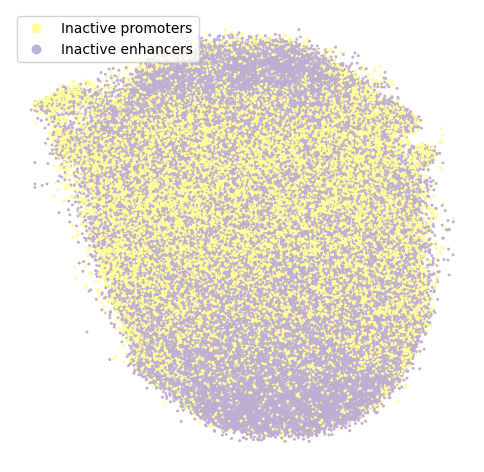

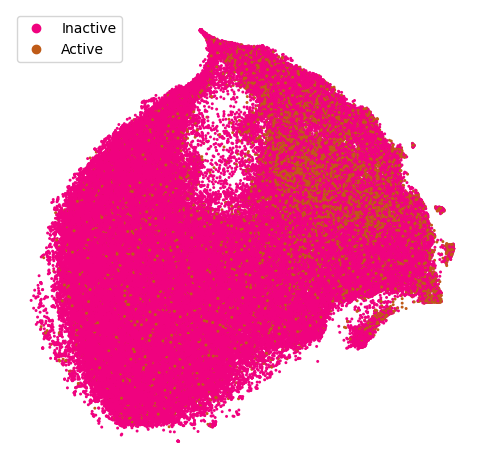

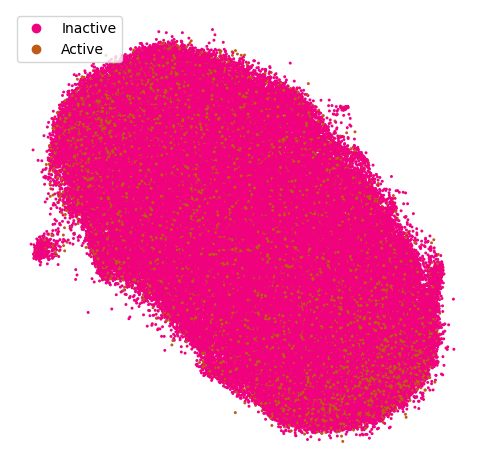

Executing CRR prediction tasks:   0%|          | 0/5 [00:00<?, ?it/s]

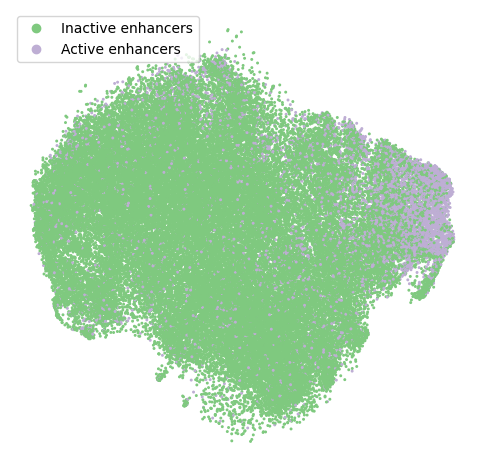

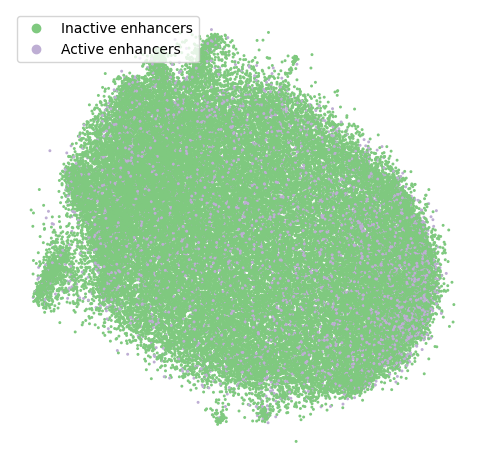

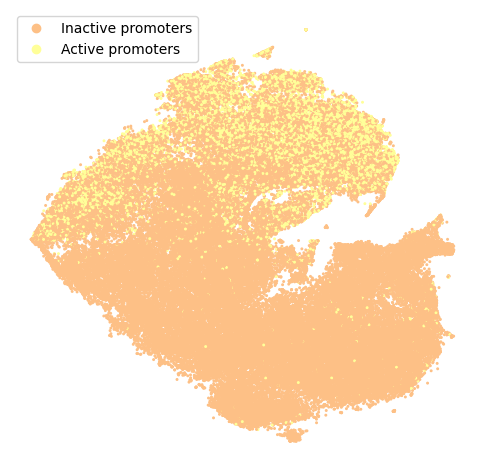

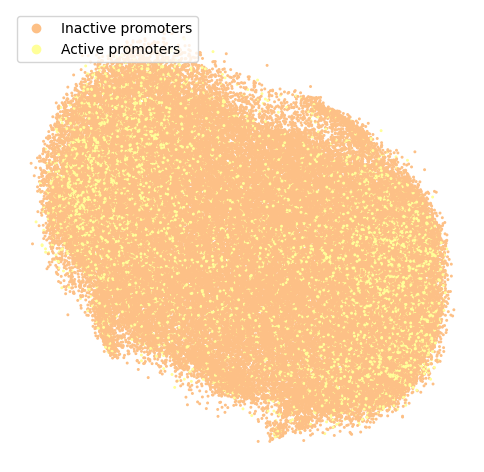

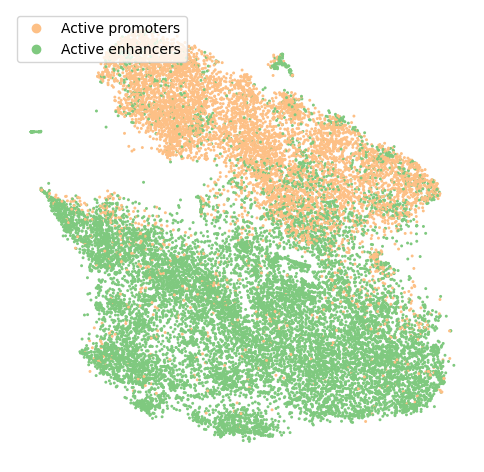

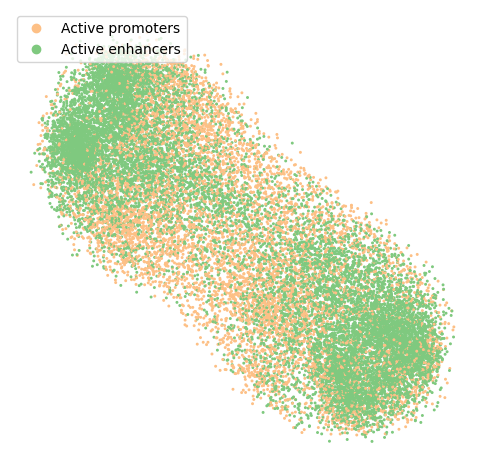

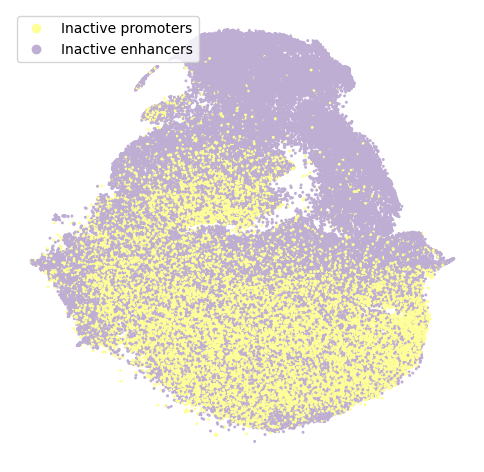

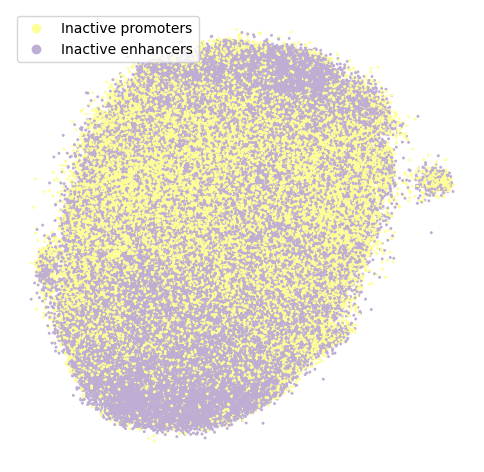

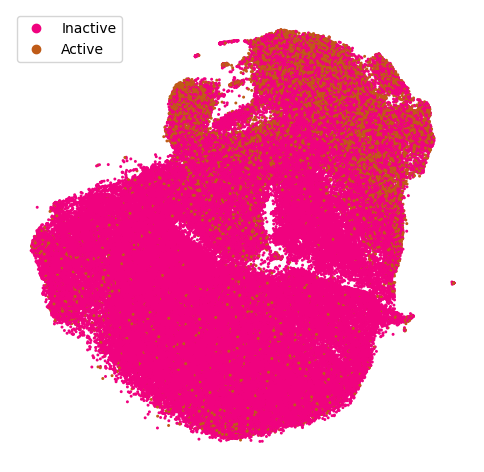

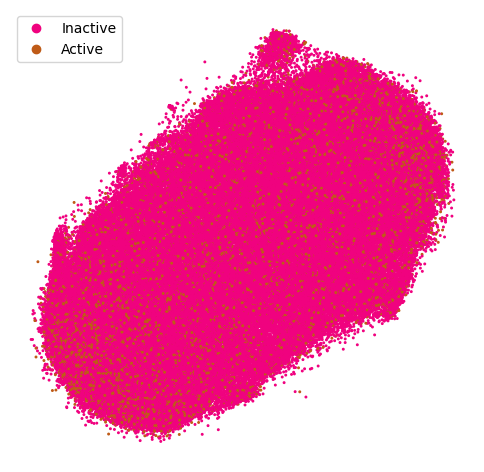

Executing CRR prediction tasks:   0%|          | 0/5 [00:00<?, ?it/s]

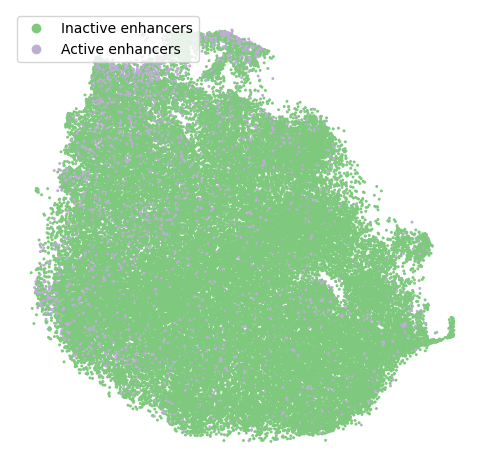

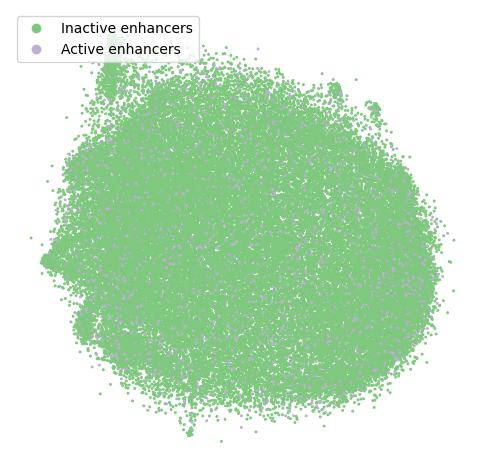

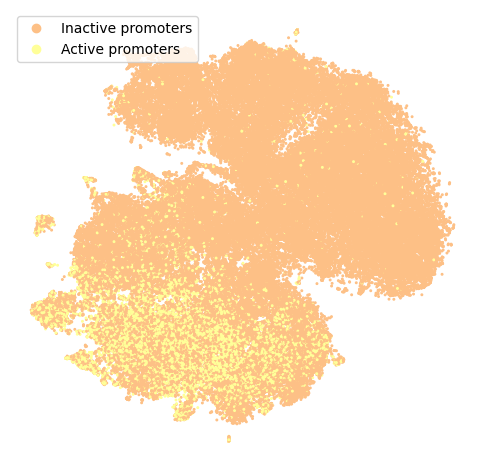

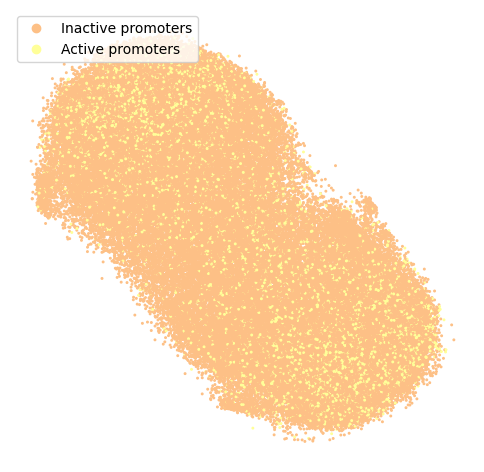

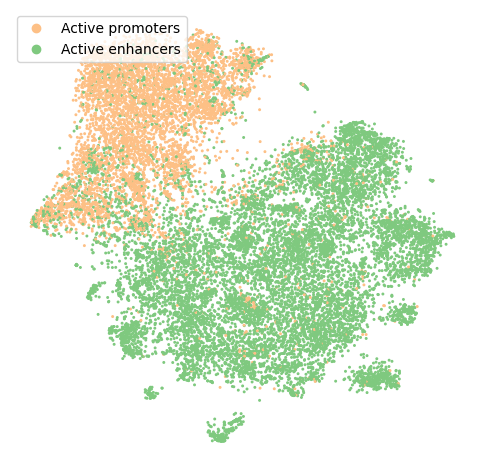

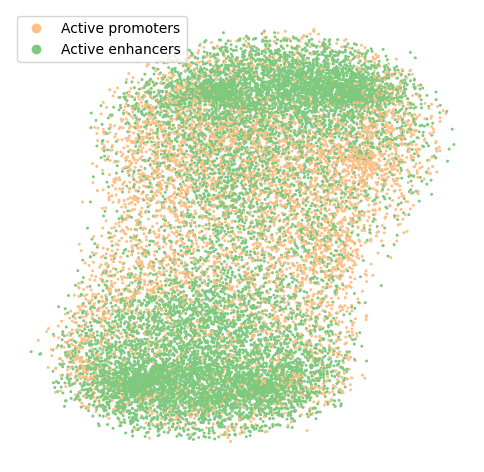

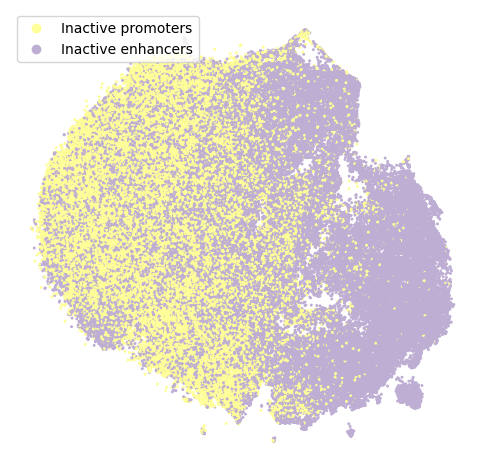

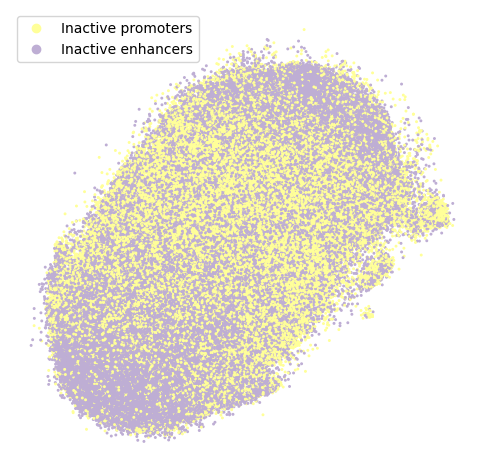

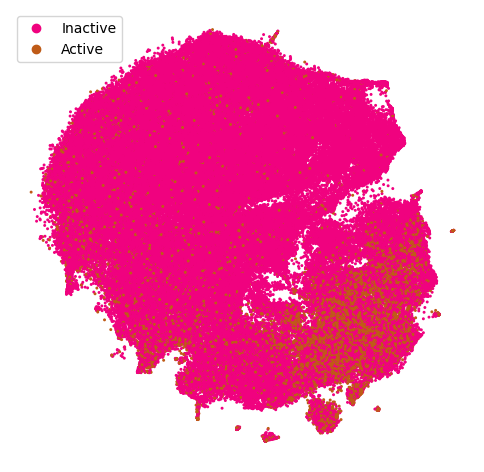

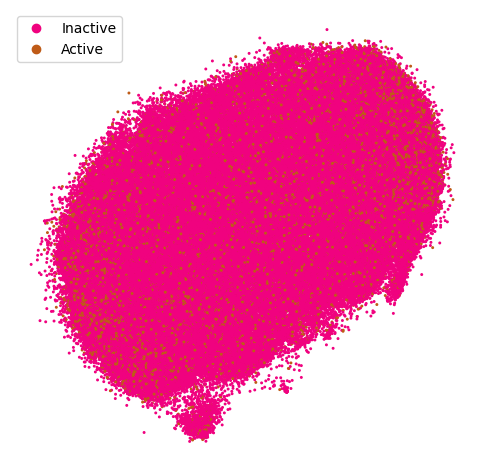

Executing CRR prediction tasks:   0%|          | 0/5 [00:00<?, ?it/s]

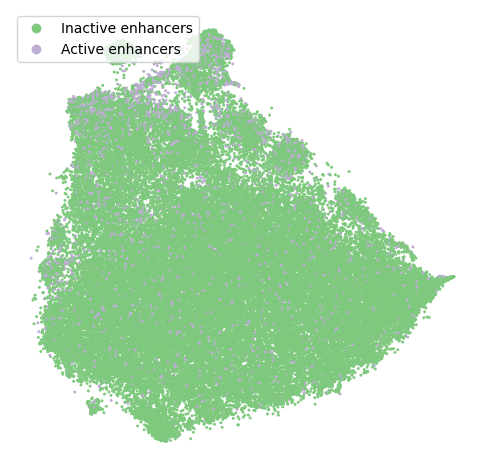

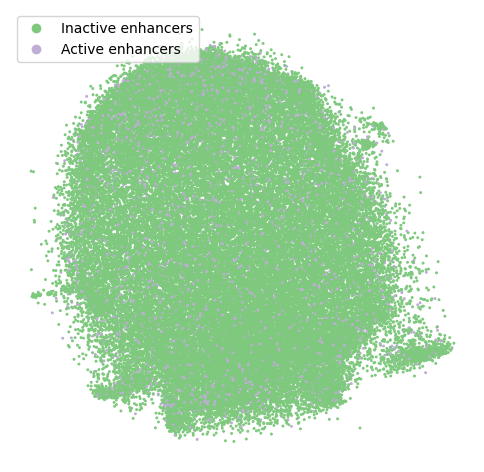

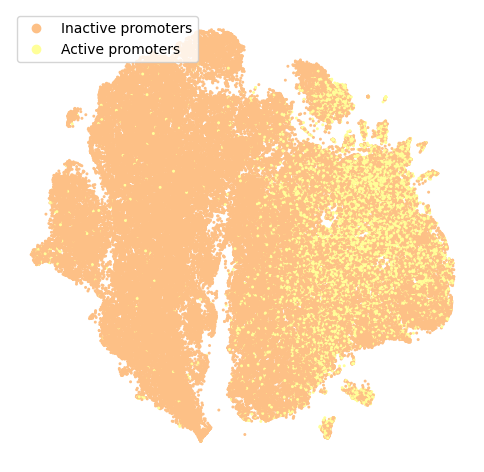

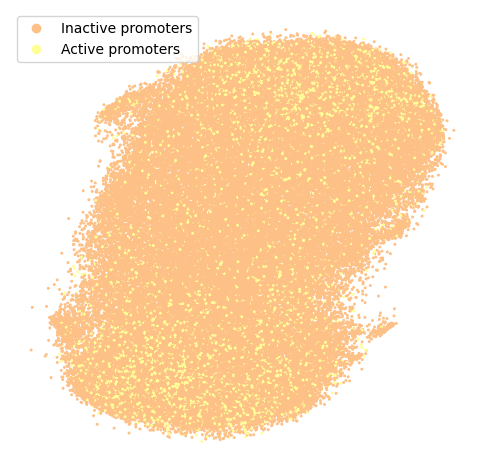

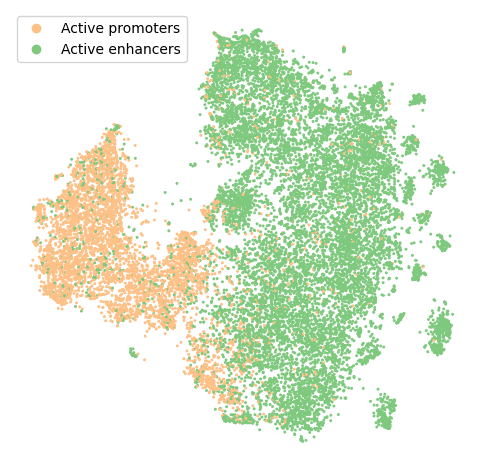

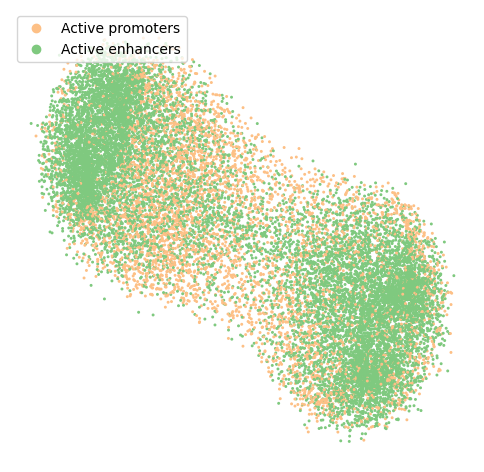

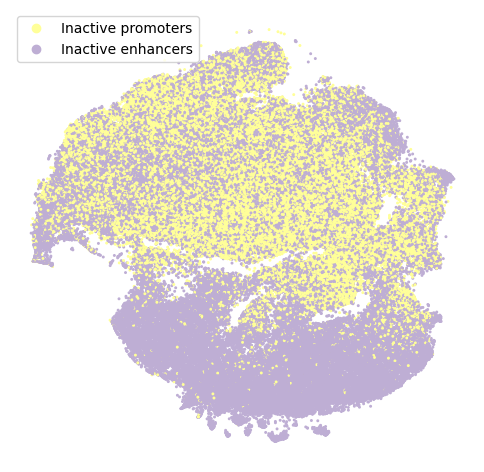

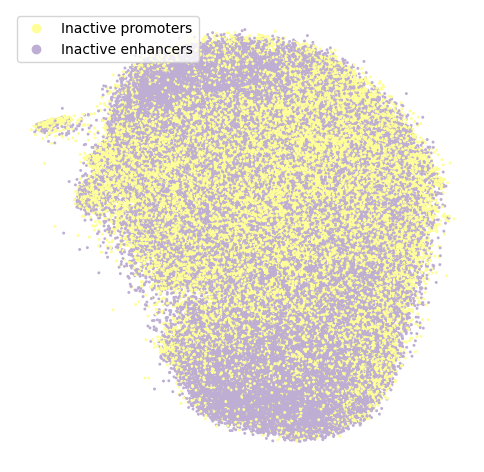

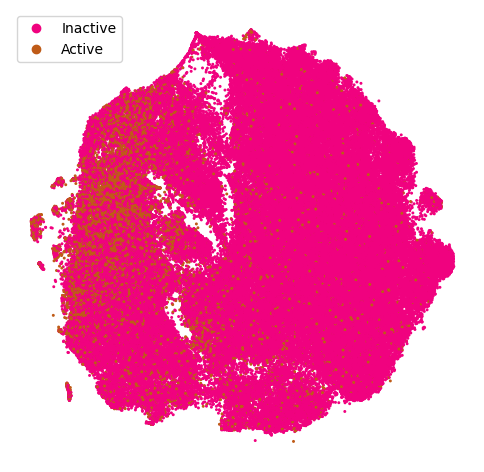

In [ ]:
random_state = 42
for cell_line in tqdm(get_cell_lines(), desc="Cell line"):
    for (X, y), task in load_all_tasks(
        cell_line=cell_line,
        assembly=genome.assembly,
        window_size=window_size
    ):
        # Shuffling to avoid the appeareance of clusters that are not actually real.
        index = np.arange(X.shape[0])
        np.random.RandomState(seed=random_state).shuffle(index)
        data = normalize_epigenomic_data(X)[index]
        bed = get_bed(X).iloc[index].reset_index(drop=True)
        labels = y.iloc[index].values
        visualize_scatter_plot(
            compute_tabular_embeddings(
                genome.assembly,
                cell_line=cell_line,
                window_size=window_size,
                data=data,
                task=task
            ).values,
            labels,
            task,
            genome.assembly,
            cell_line,
            window_size,
            "tabular",
            colors
        )
        
        visualize_scatter_plot(
            compute_sequence_embeddings(
                genome.assembly,
                cell_line=cell_line,
                window_size=window_size,
                bed=bed,
                genome=genome,
                task=task
            ).values,
            labels,
            task,
            genome.assembly,
            cell_line,
            window_size,
            "sequence",
            colors
        )